<center><font size="+4">Programming & Data Analytics & AI 1 2025/2026</font></center>
<center><font size="+2">Sant'Anna School of Advanced Studies, Pisa, Italy</font></center>
<center><img src="https://github.com/EMbeDS-education/ComputingDataAnalysisModeling20242025/raw/main/PDAI/jupyter/jupyterNotebooks/images/sssaLEMBEDSdtu.png" width="900" alt="L'EMbeDS"></center>

<center><font size="+2">Course responsible</font></center>
<center><font size="+2">Andrea Vandin a.vandin@santannapisa.it</font></center>
<center><font size="+2">Lecturer</font></center>
<center><font size="+2">Riccardo Porcedda r.porcedda@santannapisa.it</font></center>

---

<center><font size="+4">Module 2, Part 3, Research-driven topics</font></center>
<center><font size="+4">Lecture 6: Neural Networks, CNNs, and GNNs (GCN/GAT)</font></center>

---

This beginner-friendly notebook uses **TensorFlow/Keras** and follows a very explicit, step-by-step style.

Experiments:
- MLP on **MNIST**
- MLP baseline on **Cora** node classification

For both datasets we use **SGD** with learning rates:
`[0.001, 0.01, 0.1, 1.]`

Then we compare **full-batch** vs **mini-batch** training time.


### Kernel notes
Change the runtime to GPU for faster computation

## Useful links (videos and articles)
### Neural networks and optimization
- [What is a neural network? - 3Blue1Brown](https://www.youtube.com/watch?v=aircAruvnKk)
- [Gradient descent, how neural networks learn - 3Blue1Brown](https://www.youtube.com/watch?v=IHZwWFHWa-w)
- [Backpropagation, intuitively - 3Blue1Brown](https://www.youtube.com/watch?v=Ilg3gGewQ5U)

### Convolution and CNN
- [But what is a convolution? - 3Blue1Brown](https://www.youtube.com/watch?v=KuXjwB4LzSA)
- [Convolutional Neural Networks from Scratch](https://www.youtube.com/watch?v=jDe5BAsT2-Y)

### Attention and GNN
- [Attention in transformers, step by step - 3Blue1Brown](https://www.youtube.com/watch?v=eMlx5fFNoYc)
- [Graph Convolutional Networks (GCN): From CNN point of view](https://www.youtube.com/watch?v=eLcGehfjvgs)
- [A Gentle Introduction to Graph Neural Networks (Distill)](https://distill.pub/2021/gnn-intro/)
- [Understanding Convolutions on Graphs (Distill)](https://distill.pub/2021/understanding-gnns/)


# Imports and utilities



Let's first import some useful libraries, in particular **Tensorflow**. Then a tqdm function to observe progress bars when executing time consuming functions.

In [1]:
import random
import time
import tarfile
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# tqdm progress bar callback for Keras training loops.
try:
    from tqdm.keras import TqdmCallback

    def make_tqdm_callbacks():
        return [TqdmCallback(verbose=1)]

    print("tqdm available: training will show progress bars.")
except Exception:
    TqdmCallback = None

    def make_tqdm_callbacks():
        return []

    print("tqdm not available: install tqdm to enable progress bars.")

# Use a fixed seed so results are reproducible.
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.keras.utils.set_random_seed(SEED)

print("TensorFlow version:", tf.__version__)


tqdm available: training will show progress bars.
TensorFlow version: 2.19.0


# 1. Your first MLP
We will adopt the MNIST digits dataset, implement a simple MLP (**Multi Layer Perceptron**) and train it with a full-batch SGD (**Stochastic Gradient Descent**).


In [2]:
# Load MNIST: 28x28 grayscale images, labels from 0 to 9.
(x_train_mnist_images, y_train_mnist), (x_test_mnist_images, y_test_mnist) = tf.keras.datasets.mnist.load_data()

# Normalize pixel values from [0, 255] to [0, 1].
x_train_mnist_images = x_train_mnist_images.astype("float32") / 255.0
x_test_mnist_images = x_test_mnist_images.astype("float32") / 255.0

# Flatten each image to a vector of length 784 for MLP input.
x_train_mnist = x_train_mnist_images.reshape(-1, 28 * 28)
x_test_mnist = x_test_mnist_images.reshape(-1, 28 * 28)

print("Train shape:", x_train_mnist.shape)
print("Test shape:", x_test_mnist.shape)


11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Train shape: (60000, 784)
Test shape: (10000, 784)


### Quick look at MNIST data


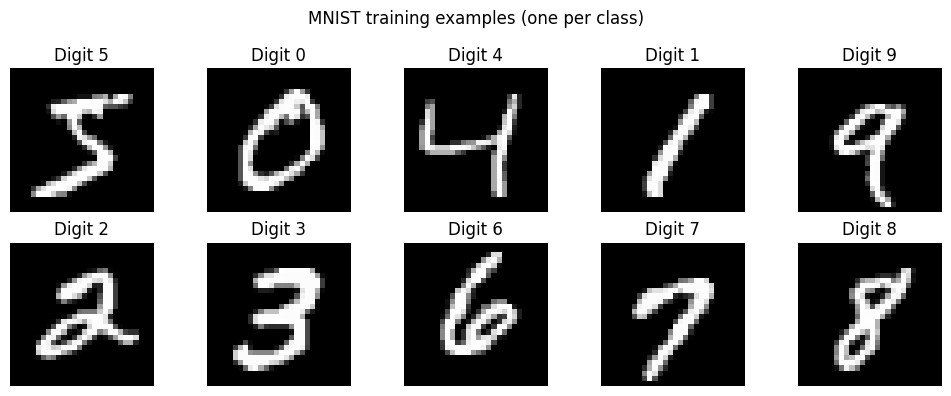

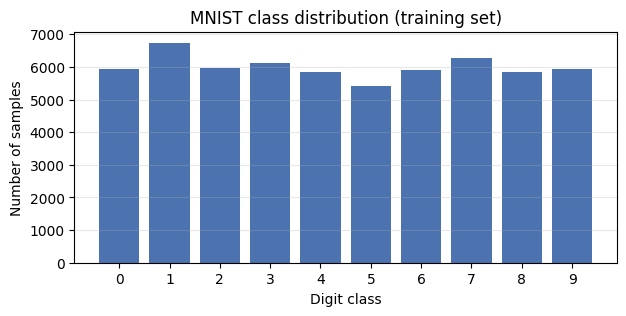

In [3]:
# Show one sample image for each class (0..9).
plt.figure(figsize=(10, 4))
shown_digits = set()
plot_idx = 1

for i in range(len(y_train_mnist)):
    digit = int(y_train_mnist[i])
    if digit in shown_digits:
        continue
    shown_digits.add(digit)

    plt.subplot(2, 5, plot_idx)
    plt.imshow(x_train_mnist_images[i], cmap="gray")
    plt.title(f"Digit {digit}")
    plt.axis("off")

    plot_idx += 1
    if len(shown_digits) == 10:
        break

plt.suptitle("MNIST training examples (one per class)")
plt.tight_layout()
plt.show()

# Show class distribution in the training set.
digits, counts = np.unique(y_train_mnist, return_counts=True)
plt.figure(figsize=(7, 3))
plt.bar(digits, counts, color="#4C72B0")
plt.xticks(digits)
plt.xlabel("Digit class")
plt.ylabel("Number of samples")
plt.title("MNIST class distribution (training set)")
plt.grid(axis="y", alpha=0.3)
plt.show()


## 1.1 Full-batch SGD


In [4]:
mnist_mlp = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(28 * 28,)),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(10),
], name="mnist_mlp")

mnist_mlp.build((None, 28 * 28))
mnist_mlp.summary()


Model: "mnist_mlp"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │       200,960 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 235,146 (918.54 KB)

 Trainable params: 235,146 (918.54 KB)

 Non-trainable params: 0 (0.00 B)

In [5]:
mnist_lrs = [0.001, 0.01, 0.1, 1.]
mnist_full_batch_results = {}
mnist_full_batch_times = {}

for lr in mnist_lrs:
    print(f"Training MNIST full-batch SGD with lr={lr}")

    # Reset state so each run starts from a new random initialization.
    tf.keras.backend.clear_session()
    tf.keras.utils.set_random_seed(SEED)

    # Compile model with SGD optimizer.
    mnist_mlp.compile(
        optimizer=tf.keras.optimizers.SGD(learning_rate=lr),
        # We use SparseCategoricalCrossentropy as loss function
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        # We save Accuracy as performance metric
        metrics=["accuracy"],
    )

    start_time = time.perf_counter()

    history = mnist_mlp.fit(
        x_train_mnist,
        y_train_mnist,
        validation_data=(x_test_mnist, y_test_mnist),
        # We set 50 epochs
        epochs=50,
        # Full-batch SGD: one update per epoch.
        batch_size=len(x_train_mnist),
        shuffle=True,
        callbacks=make_tqdm_callbacks(),
        verbose=0,
    )
    elapsed_time = time.perf_counter() - start_time

    mnist_full_batch_results[lr] = history.history
    mnist_full_batch_times[lr] = elapsed_time

    print(f"  Training time: {elapsed_time:.2f} seconds")


Training MNIST full-batch SGD with lr=0.001


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 19.89 seconds
Training MNIST full-batch SGD with lr=0.01


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 17.00 seconds
Training MNIST full-batch SGD with lr=0.1


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 18.09 seconds
Training MNIST full-batch SGD with lr=1.0


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 17.11 seconds


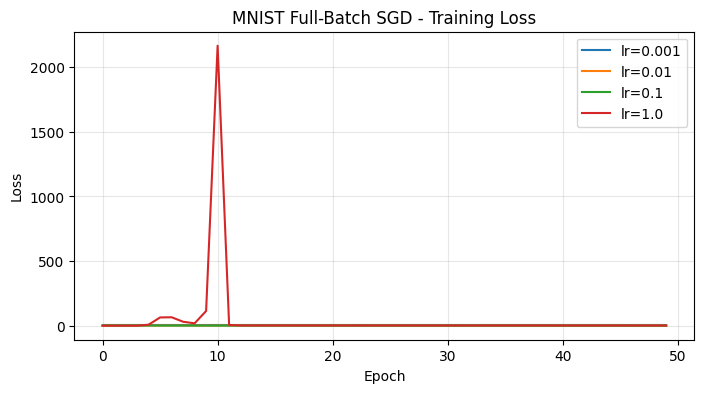

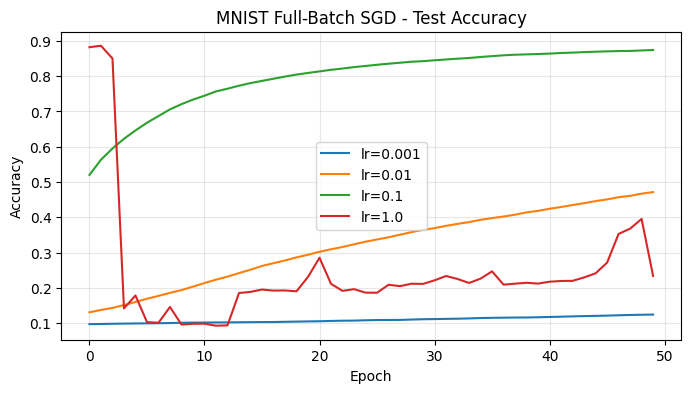

Final MNIST test accuracy (full-batch):
lr=0.001   -> val_accuracy=0.1241
lr=0.01    -> val_accuracy=0.4715
lr=0.1     -> val_accuracy=0.8744
lr=1.0     -> val_accuracy=0.2336

MNIST full-batch computation time:
lr=0.001   -> time=19.89 s
lr=0.01    -> time=17.00 s
lr=0.1     -> time=18.09 s
lr=1.0     -> time=17.11 s


In [6]:
# Training loss curves.
plt.figure(figsize=(8, 4))
for lr, hist in mnist_full_batch_results.items():
    plt.plot(hist["loss"], label=f"lr={lr}")
plt.title("MNIST Full-Batch SGD - Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

# Test accuracy curves (recorded as val_accuracy).
plt.figure(figsize=(8, 4))
for lr, hist in mnist_full_batch_results.items():
    plt.plot(hist["val_accuracy"], label=f"lr={lr}")
plt.title("MNIST Full-Batch SGD - Test Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

print("Final MNIST test accuracy (full-batch):")
for lr, hist in mnist_full_batch_results.items():
    print(f"lr={lr:<7} -> val_accuracy={hist['val_accuracy'][-1]:.4f}")

print()
print("MNIST full-batch computation time:")
for lr in mnist_lrs:
    print(f"lr={lr:<7} -> time={mnist_full_batch_times[lr]:.2f} s")


## 1.2 Mini-batch SGD
Here we keep the same MLP and compare against full-batch using mini-batches.
We want to see the differences in accuracy and computation time.


In [7]:
mnist_minibatch_results = {}
mnist_minibatch_times = {}

for lr in mnist_lrs:
    print(f"Training MNIST mini-batch SGD with lr={lr}")

    tf.keras.backend.clear_session()
    tf.keras.utils.set_random_seed(SEED)

    mnist_mlp.compile(
        optimizer=tf.keras.optimizers.SGD(learning_rate=lr),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=["accuracy"],
    )

    start_time = time.perf_counter()

    history = mnist_mlp.fit(
        x_train_mnist,
        y_train_mnist,
        validation_data=(x_test_mnist, y_test_mnist),
        epochs=50,
        # Mini-batch SGD (batch size 1024): multiple updates per epoch.
        batch_size=1024,
        shuffle=True,
        callbacks=make_tqdm_callbacks(),
        verbose=0,
    )
    elapsed_time = time.perf_counter() - start_time

    mnist_minibatch_results[lr] = history.history
    mnist_minibatch_times[lr] = elapsed_time

    print(f"  Training time: {elapsed_time:.2f} seconds")


Training MNIST mini-batch SGD with lr=0.001


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 22.63 seconds
Training MNIST mini-batch SGD with lr=0.01


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 22.45 seconds
Training MNIST mini-batch SGD with lr=0.1


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 23.43 seconds
Training MNIST mini-batch SGD with lr=1.0


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 21.83 seconds


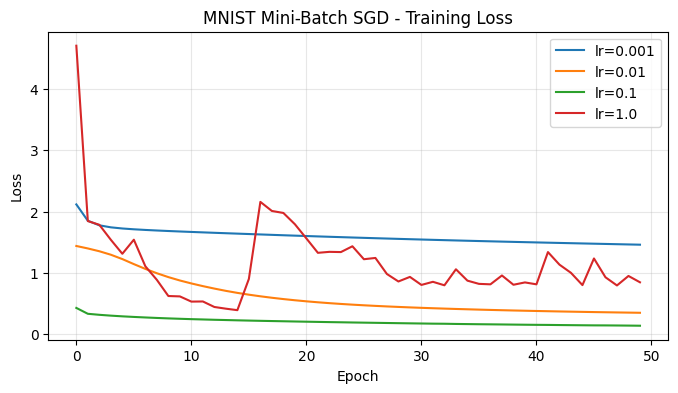

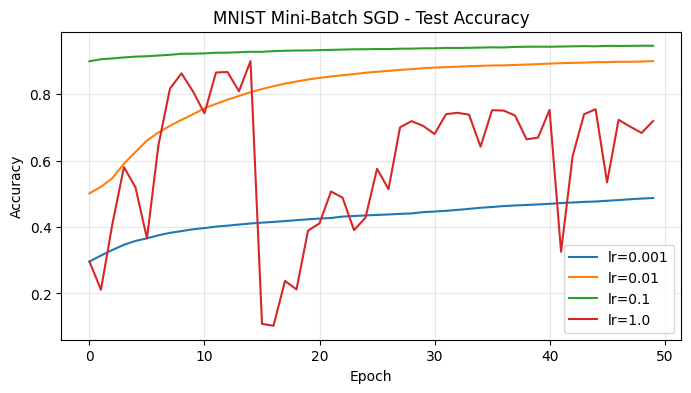

Final MNIST test accuracy (mini-batch):
lr=0.001   -> val_accuracy=0.4876
lr=0.01    -> val_accuracy=0.9002
lr=0.1     -> val_accuracy=0.9465
lr=1.0     -> val_accuracy=0.7196

MNIST mini-batch computation time:
lr=0.001   -> time=22.63 s
lr=0.01    -> time=22.45 s
lr=0.1     -> time=23.43 s
lr=1.0     -> time=21.83 s


In [8]:
# Training loss curves.
plt.figure(figsize=(8, 4))
for lr, hist in mnist_minibatch_results.items():
    plt.plot(hist["loss"], label=f"lr={lr}")
plt.title("MNIST Mini-Batch SGD - Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

# Test accuracy curves.
plt.figure(figsize=(8, 4))
for lr, hist in mnist_minibatch_results.items():
    plt.plot(hist["val_accuracy"], label=f"lr={lr}")
plt.title("MNIST Mini-Batch SGD - Test Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

print("Final MNIST test accuracy (mini-batch):")
for lr, hist in mnist_minibatch_results.items():
    print(f"lr={lr:<7} -> val_accuracy={hist['val_accuracy'][-1]:.4f}")

print()
print("MNIST mini-batch computation time:")
for lr in mnist_lrs:
    print(f"lr={lr:<7} -> time={mnist_minibatch_times[lr]:.2f} s")


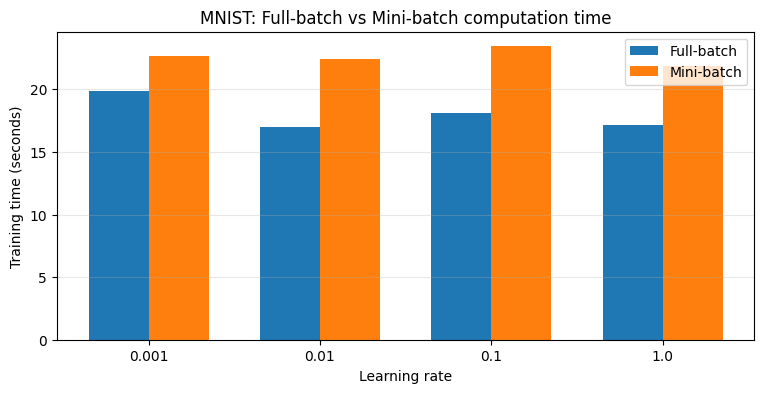

Average full-batch time: 18.02 s
Average mini-batch time: 22.59 s


In [9]:

# Time comparison bar plot.
lr_labels = [str(lr) for lr in mnist_lrs]
full_times = [mnist_full_batch_times[lr] for lr in mnist_lrs]
mini_times = [mnist_minibatch_times[lr] for lr in mnist_lrs]

x = np.arange(len(mnist_lrs))
bar_width = 0.35

plt.figure(figsize=(9, 4))
plt.bar(x - bar_width / 2, full_times, width=bar_width, label="Full-batch")
plt.bar(x + bar_width / 2, mini_times, width=bar_width, label="Mini-batch")
plt.xticks(x, lr_labels)
plt.xlabel("Learning rate")
plt.ylabel("Training time (seconds)")
plt.title("MNIST: Full-batch vs Mini-batch computation time")
plt.grid(axis="y", alpha=0.3)
plt.legend()
plt.show()

avg_full = float(np.mean(full_times))
avg_mini = float(np.mean(mini_times))
print(f"Average full-batch time: {avg_full:.2f} s")
print(f"Average mini-batch time: {avg_mini:.2f} s")

# 2. Convolutions

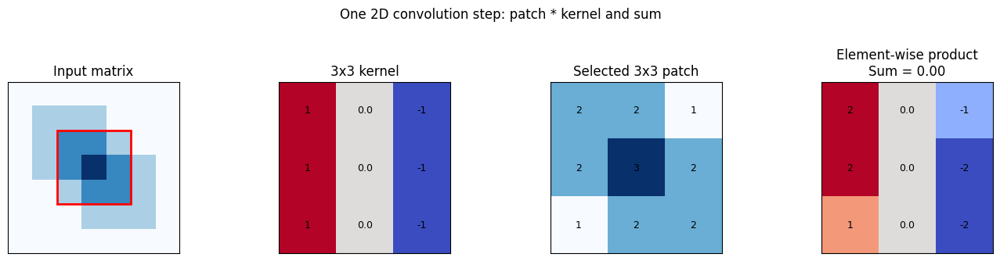

In [10]:
# Didactic static example: one convolution step on a toy matrix.
from matplotlib.patches import Rectangle

toy_input = np.array([
    [0, 0, 0, 0, 0, 0, 0],
    [0, 1, 1, 1, 0, 0, 0],
    [0, 1, 2, 2, 1, 0, 0],
    [0, 1, 2, 3, 2, 1, 0],
    [0, 0, 1, 2, 2, 1, 0],
    [0, 0, 0, 1, 1, 1, 0],
    [0, 0, 0, 0, 0, 0, 0],
], dtype="float32")

toy_kernel = np.array([
    [1, 0, -1],
    [1, 0, -1],
    [1, 0, -1],
], dtype="float32")

# Choose one window position (row=2, col=2) for demonstration.
r, c = 2, 2
toy_patch = toy_input[r:r+3, c:c+3]
toy_mult = toy_patch * toy_kernel
toy_value = float(np.sum(toy_mult))

fig, axes = plt.subplots(1, 4, figsize=(14, 3.2))

im0 = axes[0].imshow(toy_input, cmap="Blues")
axes[0].add_patch(Rectangle((c - 0.5, r - 0.5), 3, 3, fill=False, edgecolor="red", linewidth=2))
axes[0].set_title("Input matrix")
axes[0].set_xticks([])
axes[0].set_yticks([])

im1 = axes[1].imshow(toy_kernel, cmap="coolwarm")
axes[1].set_title("3x3 kernel")
axes[1].set_xticks([])
axes[1].set_yticks([])

im2 = axes[2].imshow(toy_patch, cmap="Blues")
axes[2].set_title("Selected 3x3 patch")
axes[2].set_xticks([])
axes[2].set_yticks([])

im3 = axes[3].imshow(toy_mult, cmap="coolwarm")
axes[3].set_title(f"Element-wise product\nSum = {toy_value:.2f}")
axes[3].set_xticks([])
axes[3].set_yticks([])

for ax, mat in [(axes[1], toy_kernel), (axes[2], toy_patch), (axes[3], toy_mult)]:
    rows, cols = mat.shape
    for i in range(rows):
        for j in range(cols):
            ax.text(j, i, f"{mat[i, j]:.0f}" if abs(mat[i, j]) >= 1 else f"{mat[i, j]:.1f}",
                    ha="center", va="center", color="black", fontsize=9)

plt.suptitle("One 2D convolution step: patch * kernel and sum", y=1.03)
plt.tight_layout()
plt.show()


In [11]:
sobel_x_3x3 = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1],
], dtype="float32") / 4.0

sobel_y_3x3 = np.transpose(sobel_x_3x3)

blur_3x3 = np.ones((3, 3), dtype="float32") / 9.0

blur_5x5 = np.ones((5, 5), dtype="float32") / 25.0

gaussian_blur_3x3 = np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1],
], dtype="float32") / 16.0

preset_kernels = {
    "sobel_x": sobel_x_3x3,
    "sobel_y": sobel_y_3x3,
    "blur": blur_3x3,
    "blur_5x5": blur_5x5,
    "gaussian_blur": gaussian_blur_3x3,
}


Selected filter preset: sobel_x
Kernel shape: (3, 3)
[[ 0.25  0.   -0.25]
 [ 0.5   0.   -0.5 ]
 [ 0.25  0.   -0.25]]


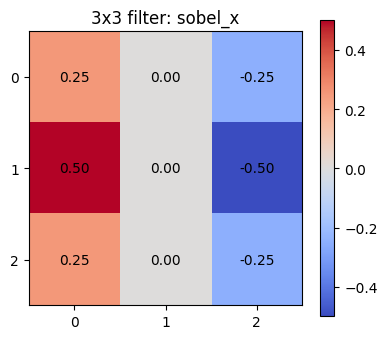

In [12]:
filter_preset = "sobel_x"

if filter_preset not in preset_kernels:
    raise ValueError(f"Unknown preset '{filter_preset}'. Use one of: {list(preset_kernels.keys())}")

conv_kernel = preset_kernels[filter_preset]

print("Selected filter preset:", filter_preset)
print("Kernel shape:", conv_kernel.shape)
print(conv_kernel)

plt.figure(figsize=(4, 4))
plt.imshow(conv_kernel, cmap="coolwarm")
plt.colorbar(shrink=0.8)
plt.title(f"3x3 filter: {filter_preset}")
plt.xticks(range(3))
plt.yticks(range(3))

for i in range(3):
    for j in range(3):
        plt.text(j, i, f"{conv_kernel[i, j]:.2f}", ha="center", va="center", color="black", fontsize=10)

plt.tight_layout()
plt.show()

In [13]:
# Animation: left = MNIST digit with moving colored filter, right = convolution result building over time.
from matplotlib import animation

# Increase allowed embedded animation size in notebooks (MB).
plt.rcParams["animation.embed_limit"] = 50
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
from IPython.display import HTML
from matplotlib.patches import Rectangle

# Pick a digit image from MNIST.
digit_index = 2
digit_image = x_train_mnist_images[digit_index]

kernel = conv_kernel.astype("float32")
k = kernel.shape[0]
img_h, img_w = digit_image.shape

# For smoother notebook rendering, we animate with stride=2.
# Set animation_stride = 1 for denser animation (more frames, slower rendering).
animation_stride = 2
row_positions = np.arange(0, img_h - k + 1, animation_stride, dtype=np.int32)
col_positions = np.arange(0, img_w - k + 1, animation_stride, dtype=np.int32)
out_h = len(row_positions)
out_w = len(col_positions)
total_frames = out_h * out_w

# Compute convolution with a vectorized TensorFlow op (faster than Python loops).
# TensorFlow conv2d here performs cross-correlation, consistent with our manual patch*kernel sum.
digit_tf = tf.convert_to_tensor(digit_image[None, :, :, None], dtype=tf.float32)
kernel_tf = tf.convert_to_tensor(kernel[:, :, None, None], dtype=tf.float32)
conv_output_full = tf.nn.conv2d(
    digit_tf,
    kernel_tf,
    strides=[1, animation_stride, animation_stride, 1],
    padding="VALID",
)[0, :, :, 0].numpy()

# This matrix is filled frame-by-frame during animation.
conv_output_running = np.full((out_h, out_w), np.nan, dtype="float32")

fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(10, 4))

# Left panel: digit + moving convolution window.
ax_left.imshow(digit_image, cmap="gray", vmin=0, vmax=1, interpolation="nearest")
window_rect = Rectangle((-0.5, -0.5), k, k, fill=False, edgecolor="yellow", linewidth=2)
ax_left.add_patch(window_rect)
ax_left.set_title(f"Digit image (index={digit_index})\nSliding {k}x{k} filter")
ax_left.axis("off")

# Common diverging colormap:
# blue (negative), black (near zero), red (positive).
rbk_cmap = LinearSegmentedColormap.from_list("rbk", ["blue", "black", "red"], N=256)
rbk_cmap.set_bad(color="lightgray")

# Kernel colors are normalized around 0.
kernel_abs_max = float(np.max(np.abs(kernel)))
if kernel_abs_max == 0:
    kernel_abs_max = 1e-6
kernel_norm = TwoSlopeNorm(vmin=-kernel_abs_max, vcenter=0.0, vmax=kernel_abs_max)

# Draw colored kernel cells (no numeric values).
kernel_patches = []
for i in range(k):
    row_patches = []
    for j in range(k):
        patch = Rectangle(
            (j - 0.5, i - 0.5),
            1,
            1,
            facecolor=rbk_cmap(kernel_norm(float(kernel[i, j]))),
            edgecolor="white",
            linewidth=0.8,
            alpha=0.75,
        )
        ax_left.add_patch(patch)
        row_patches.append(patch)
    kernel_patches.append(row_patches)

# Right panel: convolution output being filled progressively.
out_abs_max = float(np.max(np.abs(conv_output_full)))
if out_abs_max == 0:
    out_abs_max = 1e-6
out_norm = TwoSlopeNorm(vmin=-out_abs_max, vcenter=0.0, vmax=out_abs_max)

im_right = ax_right.imshow(
    conv_output_running,
    cmap=rbk_cmap,
    norm=out_norm,
    interpolation="nearest",
)
ax_right.set_title("Convolution output (building)")
ax_right.set_xlabel("Output column")
ax_right.set_ylabel("Output row")
fig.colorbar(im_right, ax=ax_right, fraction=0.046, pad=0.04)

status_text = ax_right.text(0.02, 1.02, "", transform=ax_right.transAxes)

# Flatten for quick return in blitting.
kernel_patch_list = [p for row in kernel_patches for p in row]


def init():
    # Initial placement of window and kernel overlay.
    r0 = int(row_positions[0])
    c0 = int(col_positions[0])
    window_rect.set_xy((c0 - 0.5, r0 - 0.5))
    for i in range(k):
        for j in range(k):
            kernel_patches[i][j].set_xy((c0 + j - 0.5, r0 + i - 0.5))
    im_right.set_data(conv_output_running)
    status_text.set_text("")
    return [window_rect, im_right, status_text, *kernel_patch_list]


def update(frame_idx):
    out_r = frame_idx // out_w
    out_c = frame_idx % out_w
    r = int(row_positions[out_r])
    c = int(col_positions[out_c])

    # Move the filter window and colored kernel blocks.
    window_rect.set_xy((c - 0.5, r - 0.5))
    for i in range(k):
        for j in range(k):
            kernel_patches[i][j].set_xy((c + j - 0.5, r + i - 0.5))

    # Fill one output value.
    conv_output_running[out_r, out_c] = conv_output_full[out_r, out_c]
    im_right.set_data(conv_output_running)

    return [window_rect, im_right, status_text, *kernel_patch_list]


ani = animation.FuncAnimation(
    fig,
    update,
    init_func=init,
    frames=total_frames,
    interval=80,
    blit=True,
    repeat=True,
)

plt.close(fig)
HTML(ani.to_jshtml(default_mode="loop"))


## 2.1 Your first CNN

We now implement a simple CNN (**Convolutional Neural Network**) and compare performances on MNIST with MLP

In [14]:
# Prepare MNIST tensors with channel dimension for CNN input.
x_train_mnist_cnn = x_train_mnist_images[..., None].astype("float32")
x_test_mnist_cnn = x_test_mnist_images[..., None].astype("float32")

print("CNN input shape (train):", x_train_mnist_cnn.shape)
print("CNN input shape (test):", x_test_mnist_cnn.shape)


CNN input shape (train): (60000, 28, 28, 1)
CNN input shape (test): (10000, 28, 28, 1)


In [15]:
# Train a simple CNN from scratch on MNIST.
tf.keras.backend.clear_session()
tf.keras.utils.set_random_seed(SEED)

cnn_mnist_model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(28, 28, 1)),
    tf.keras.layers.Conv2D(32, kernel_size=3, padding="same", activation="relu"),
    tf.keras.layers.MaxPooling2D(pool_size=2),
    tf.keras.layers.Conv2D(64, kernel_size=3, padding="same", activation="relu"),
    tf.keras.layers.MaxPooling2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10),
], name="cnn_mnist_scratch")


cnn_mnist_model.summary()

Model: "cnn_mnist_scratch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 10)             │        31,370 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 50,186 (196.04 KB)

 Trainable params: 50,186 (196.04 KB)

 Non-trainable params: 0 (0.00 B)

In [16]:
cnn_mnist_model.compile(
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=["accuracy"],
)

start_time = time.perf_counter()
cnn_mnist_history = cnn_mnist_model.fit(
    x_train_mnist_cnn,
    y_train_mnist,
    validation_data=(x_test_mnist_cnn, y_test_mnist),
    epochs=50,
    batch_size=1024,
    shuffle=True,
    callbacks=make_tqdm_callbacks(),
    verbose=0,
)
cnn_mnist_time = time.perf_counter() - start_time

_, cnn_mnist_test_acc = cnn_mnist_model.evaluate(x_test_mnist_cnn, y_test_mnist, verbose=0)
print(f"CNN scratch MNIST test accuracy: {cnn_mnist_test_acc:.4f}")
print(f"CNN scratch MNIST training time: {cnn_mnist_time:.2f} s")

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

CNN scratch MNIST test accuracy: 0.9620
CNN scratch MNIST training time: 74.33 s


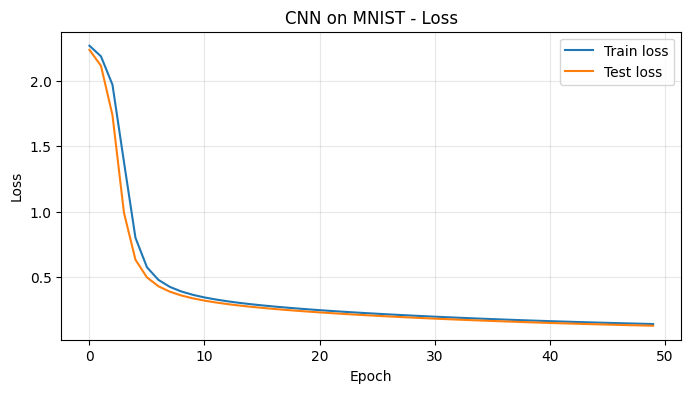

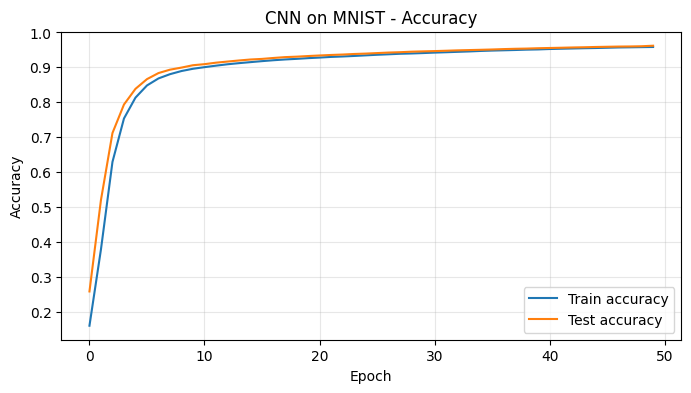

In [17]:
# Plot CNN training curves.
plt.figure(figsize=(8, 4))
plt.plot(cnn_mnist_history.history["loss"], label="Train loss")
plt.plot(cnn_mnist_history.history["val_loss"], label="Test loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("CNN on MNIST - Loss")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(cnn_mnist_history.history["accuracy"], label="Train accuracy")
plt.plot(cnn_mnist_history.history["val_accuracy"], label="Test accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("CNN on MNIST - Accuracy")
plt.grid(alpha=0.3)
plt.legend()
plt.show()


In [18]:
# Compare CNN against the best MLP run (selected by final test accuracy).
mlp_candidates = []

if "mnist_full_batch_results" in globals() and "mnist_full_batch_times" in globals():
    for lr, hist in mnist_full_batch_results.items():
        mlp_candidates.append(
            {
                "mode": "full-batch",
                "lr": float(lr),
                "test_acc": float(hist["val_accuracy"][-1]),
                "time": float(mnist_full_batch_times[lr]),
                "history": hist,
            }
        )

if "mnist_minibatch_results" in globals() and "mnist_minibatch_times" in globals():
    for lr, hist in mnist_minibatch_results.items():
        mlp_candidates.append(
            {
                "mode": "mini-batch",
                "lr": float(lr),
                "test_acc": float(hist["val_accuracy"][-1]),
                "time": float(mnist_minibatch_times[lr]),
                "history": hist,
            }
        )

if not mlp_candidates:
    raise RuntimeError("Run MNIST MLP cells first so comparison can use MLP results.")

if "cnn_mnist_test_acc" not in globals() or "cnn_mnist_time" not in globals():
    raise RuntimeError("Run the CNN training cell first so comparison can use CNN results.")

best_mlp = max(mlp_candidates, key=lambda d: d["test_acc"])

print("Best MLP run used for comparison:")
print(f"  mode={best_mlp['mode']}, lr={best_mlp['lr']}")
print(f"  test_accuracy={best_mlp['test_acc']:.4f}, training_time={best_mlp['time']:.2f} s")

print("CNN run:")
print(f"  test_accuracy={cnn_mnist_test_acc:.4f}, training_time={cnn_mnist_time:.2f} s")

Best MLP run used for comparison:
  mode=mini-batch, lr=0.1
  test_accuracy=0.9465, training_time=23.43 s
CNN run:
  test_accuracy=0.9620, training_time=74.33 s


# 3. Transfer learning
This section focuses on one key transfer-learning skill:
- load a pretrained CNN,
- cut it at an internal layer,
- use `model.predict(...)` to extract embeddings.

We won't do further training as it would take too much time, but you are free to experiment

### Workflow
1. Import pretrained **VGG16**.
2. Cut the model at `block4_pool`.
3. Prepare MNIST images to match VGG input format.
4. Run `predict` and inspect the embedding vectors.


In [19]:
# Prepare MNIST tensors with a channel dimension (needed by CNN models).
x_train_mnist_cnn = x_train_mnist_images[..., None].astype("float32")
x_test_mnist_cnn = x_test_mnist_images[..., None].astype("float32")

print("MNIST CNN input shape:", x_train_mnist_cnn.shape)


MNIST CNN input shape: (60000, 28, 28, 1)


In [20]:
# Step 1) Import pretrained VGG16.
# Step 2) Cut it at an internal layer.
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model

# Keep only convolutional VGG16 layers (no top classifier).
vgg_input_size = 96
vgg16_base = VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(vgg_input_size, vgg_input_size, 3),
)

# Trim the model at block4_pool to get intermediate embeddings.
cut_layer_name = "block4_pool"
vgg16_embedder = Model(
    inputs=vgg16_base.input,
    outputs=vgg16_base.get_layer(cut_layer_name).output,
    name=f"vgg16_until_{cut_layer_name}",
)

# We only extract features, so training is disabled.
vgg16_embedder.trainable = False
for layer in vgg16_embedder.layers:
    layer.trainable = False

print("Cut layer:", cut_layer_name)
print("Embedder output shape:", vgg16_embedder.output_shape)
print("Trainable weights in embedder:", len(vgg16_embedder.trainable_weights))


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Cut layer: block4_pool
Embedder output shape: (None, 6, 6, 512)
Trainable weights in embedder: 0


In [21]:
# Step 3) Prepare a small MNIST batch for embedding extraction.
num_examples = 64
x_embed_input = x_test_mnist_cnn[:num_examples]
y_embed_labels = y_test_mnist[:num_examples]

# VGG16 expects RGB images at vgg_input_size x vgg_input_size and ImageNet preprocessing.
x_embed_prepared = tf.image.resize(x_embed_input, (vgg_input_size, vgg_input_size))
x_embed_prepared = tf.image.grayscale_to_rgb(x_embed_prepared)
x_embed_prepared = preprocess_input(x_embed_prepared * 255.0)

print("Input for embedder:", x_embed_prepared.shape)

# Step 4) Use model.predict to extract embeddings.
embeddings_4d = vgg16_embedder.predict(x_embed_prepared, verbose=0)
print("Raw embedding tensor shape:", embeddings_4d.shape)


Input for embedder: (64, 96, 96, 3)
Raw embedding tensor shape: (64, 6, 6, 512)


In [22]:
# Flatten 4D embeddings to vectors (one vector per image).
embeddings_2d = embeddings_4d.reshape(embeddings_4d.shape[0], -1)
print("Flattened embedding matrix shape:", embeddings_2d.shape)

# Show a few numbers from the first embedding vector.
print("First embedding vector (first 20 values):")
print(np.round(embeddings_2d[0, :20], 3))

# Show embedding norms for the first 10 samples.
embedding_norms = np.linalg.norm(embeddings_2d, axis=1)
print("First 10 embedding norms:", np.round(embedding_norms[:10], 3))


Flattened embedding matrix shape: (64, 18432)
First embedding vector (first 20 values):
[  0.      0.      0.      0.    208.673   0.      0.     90.824 217.295
  43.555   0.    208.353   0.      0.      0.      0.      0.     50.729
   0.      0.   ]
First 10 embedding norms: [17703.428 19462.496 12434.311 18976.65  17575.543 12966.42  18050.295
 17869.756 17370.166 18230.99 ]


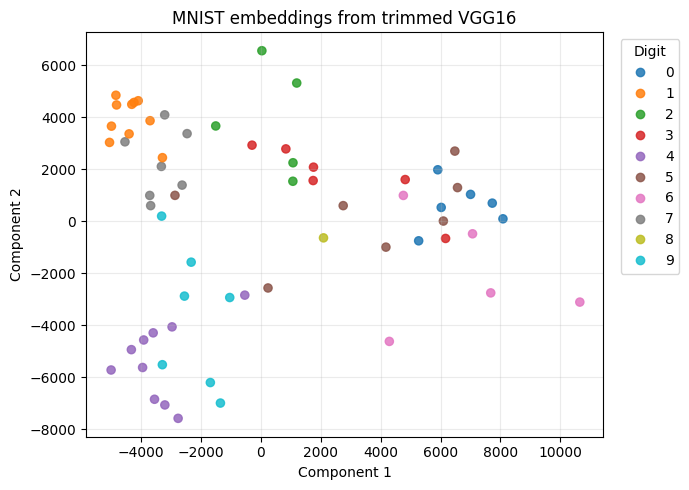

In [23]:
# Optional visualization: project embeddings to 2D with SVD (PCA-like) for intuition.
x_centered = embeddings_2d - embeddings_2d.mean(axis=0, keepdims=True)
_, _, vt = np.linalg.svd(x_centered, full_matrices=False)
embeddings_proj_2d = x_centered @ vt[:2].T

plt.figure(figsize=(7, 5))
scatter = plt.scatter(
    embeddings_proj_2d[:, 0],
    embeddings_proj_2d[:, 1],
    c=y_embed_labels,
    cmap="tab10",
    s=35,
    alpha=0.85,
)
handles, _ = scatter.legend_elements()
plt.legend(handles, [str(i) for i in sorted(set(y_embed_labels.tolist()))], title="Digit", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.title("MNIST embeddings from trimmed VGG16")
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()


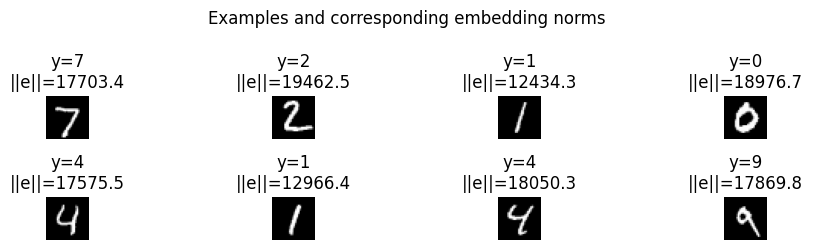

In [24]:
# Show a few original images with their embedding-vector lengths.
plt.figure(figsize=(10, 2.5))
for i in range(8):
    plt.subplot(2, 4, i + 1)
    plt.imshow(x_embed_input[i, :, :, 0], cmap="gray")
    plt.title(f"y={int(y_embed_labels[i])}\n||e||={embedding_norms[i]:.1f}")
    plt.axis("off")
plt.suptitle("Examples and corresponding embedding norms")
plt.tight_layout()
plt.show()


# 4. Graph data (from MLP and CNN to GNN)

We are gonna use now the Cora dataset, a citation network widely used in graph tasks benchmarks.
First, we will see what an MLP can do using the features on single observations (the scientific papers), without using the relationships (the citations).

Then, we will see what happens when implementing Graph Neural Networks


### Quick look at the Cora dataset

In [25]:
# Download Cora archive.
cora_url = "https://linqs-data.soe.ucsc.edu/public/lbc/cora.tgz"
archive_path = Path(tf.keras.utils.get_file("cora.tgz", origin=cora_url))

# Extract to a deterministic directory to avoid path issues on Colab.
extract_dir = archive_path.parent / "cora_extracted"
extract_dir.mkdir(parents=True, exist_ok=True)

content_candidates = list(extract_dir.rglob("cora.content"))
if not content_candidates:
    with tarfile.open(archive_path, "r:gz") as tar:
        tar.extractall(path=extract_dir)
    content_candidates = list(extract_dir.rglob("cora.content"))

if not content_candidates:
    raise FileNotFoundError(f"Could not find cora.content under {extract_dir}")

content_path = content_candidates[0]
print("Using Cora content file:", content_path)

# Each row: paper_id, 1433 binary word features, class label.
content = np.genfromtxt(content_path, dtype=str)

# Build feature matrix and label vector.
x_cora = content[:, 1:-1].astype("float32")
labels_str = content[:, -1]

# Map string labels to integer class IDs.
cora_classes = sorted(set(labels_str.tolist()))
label_to_index = {name: idx for idx, name in enumerate(cora_classes)}
y_cora = np.array([label_to_index[name] for name in labels_str], dtype="int32")

# Random 60/20/20 split.
rng = np.random.default_rng(SEED)
indices = rng.permutation(len(x_cora))

n_train = int(0.6 * len(x_cora))
n_val = int(0.2 * len(x_cora))

train_idx = indices[:n_train]
val_idx = indices[n_train : n_train + n_val]
test_idx = indices[n_train + n_val :]

x_train_cora, y_train_cora = x_cora[train_idx], y_cora[train_idx]
x_val_cora, y_val_cora = x_cora[val_idx], y_cora[val_idx]
x_test_cora, y_test_cora = x_cora[test_idx], y_cora[test_idx]

print("Cora features shape:", x_cora.shape)
print("Number of classes:", len(cora_classes))
print("Train/Val/Test sizes:", len(x_train_cora), len(x_val_cora), len(x_test_cora))


168052/168052 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Using Cora content file: /root/.keras/datasets/cora_extracted/cora/cora.content


/tmp/ipython-input-1035/1617386126.py:12: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=extract_dir)


Cora features shape: (2708, 1433)
Number of classes: 7
Train/Val/Test sizes: 1624 541 543


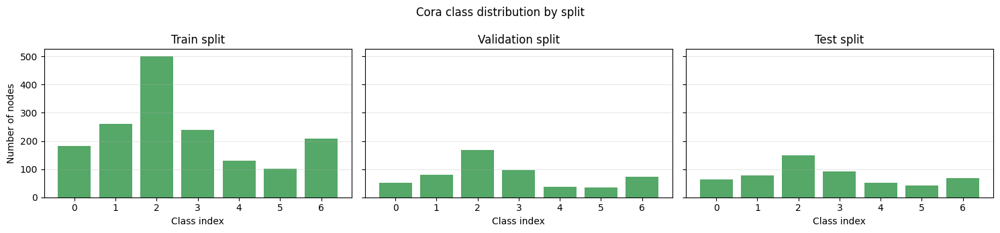

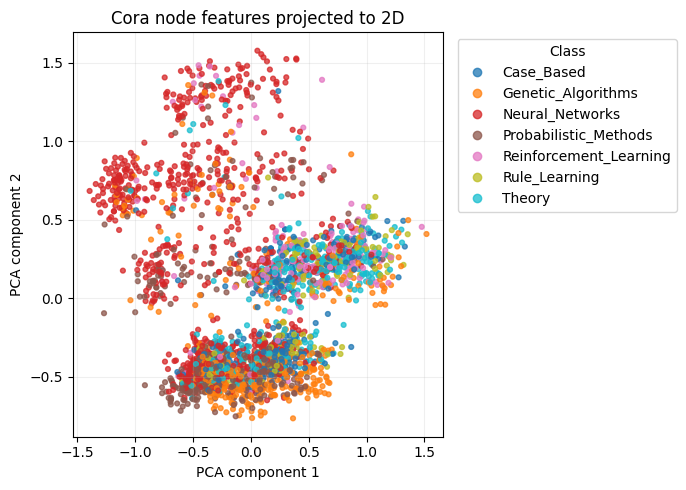

In [26]:
# Show class distribution for train/validation/test splits.
split_targets = {
    "Train": y_train_cora,
    "Validation": y_val_cora,
    "Test": y_test_cora,
}

fig, axes = plt.subplots(1, 3, figsize=(15, 3.5), sharey=True)
for ax, (name, labels) in zip(axes, split_targets.items()):
    cls, cnt = np.unique(labels, return_counts=True)
    ax.bar(cls, cnt, color="#55A868")
    ax.set_title(f"{name} split")
    ax.set_xlabel("Class index")
    ax.set_xticks(cls)
    ax.grid(axis="y", alpha=0.3)
axes[0].set_ylabel("Number of nodes")
plt.suptitle("Cora class distribution by split")
plt.tight_layout()
plt.show()

# PCA-like projection via SVD from 1433D to 2D.
x_centered = x_cora - x_cora.mean(axis=0, keepdims=True)
_, _, vt = np.linalg.svd(x_centered, full_matrices=False)
x_cora_2d = x_centered @ vt[:2].T

plt.figure(figsize=(7, 5))
scatter = plt.scatter(
    x_cora_2d[:, 0],
    x_cora_2d[:, 1],
    c=y_cora,
    cmap="tab10",
    s=12,
    alpha=0.75,
)
handles, _ = scatter.legend_elements()
plt.legend(handles, cora_classes, title="Class", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.xlabel("PCA component 1")
plt.ylabel("PCA component 2")
plt.title("Cora node features projected to 2D")
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()


## 4.1 Let's train a MLP


In [27]:
from IPython.display import Image, display

cora_mlp = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(x_train_cora.shape[1],)),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(len(cora_classes)),
], name="cora_mlp")

cora_mlp.build((None, x_train_cora.shape[1]))

cora_mlp.summary()


Model: "cora_mlp"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 64)             │        91,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 7)              │           455 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 92,231 (360.28 KB)

 Trainable params: 92,231 (360.28 KB)

 Non-trainable params: 0 (0.00 B)

In [28]:
cora_lrs = [0.001, 0.01, 0.1, 1.]
cora_full_batch_results = {}
cora_full_batch_times = {}

for lr in cora_lrs:
    print(f"Training Cora full-batch SGD with lr={lr}")

    tf.keras.backend.clear_session()
    tf.keras.utils.set_random_seed(SEED)

    cora_mlp.compile(
        optimizer=tf.keras.optimizers.SGD(learning_rate=lr),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=["accuracy"],
    )

    # Full-batch GD.
    start_time = time.perf_counter()
    history = cora_mlp.fit(
        x_train_cora,
        y_train_cora,
        validation_data=(x_val_cora, y_val_cora),
        epochs=50,
        batch_size=len(x_train_cora),
        shuffle=True,
        callbacks=make_tqdm_callbacks(),
        verbose=0,
    )
    elapsed_time = time.perf_counter() - start_time

    # Final test evaluation.
    _, test_acc = cora_mlp.evaluate(x_test_cora, y_test_cora, verbose=0)

    hist = history.history
    hist["test_accuracy"] = [float(test_acc)] * len(hist["loss"])
    cora_full_batch_results[lr] = hist
    cora_full_batch_times[lr] = elapsed_time

    print(f"  Training time: {elapsed_time:.2f} seconds")


Training Cora full-batch SGD with lr=0.001


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 6.47 seconds
Training Cora full-batch SGD with lr=0.01


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 5.57 seconds
Training Cora full-batch SGD with lr=0.1


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 6.61 seconds
Training Cora full-batch SGD with lr=1.0


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

  Training time: 5.55 seconds


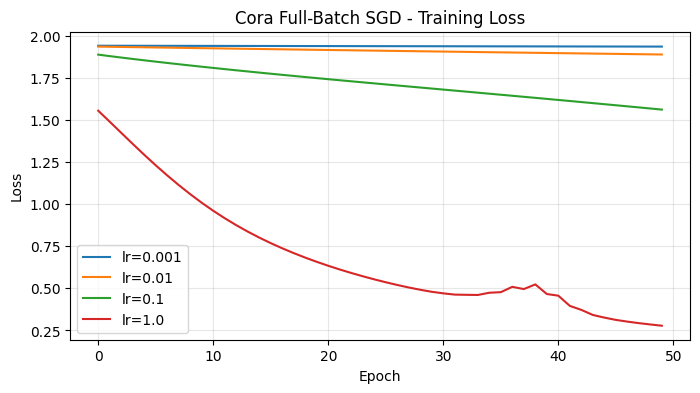

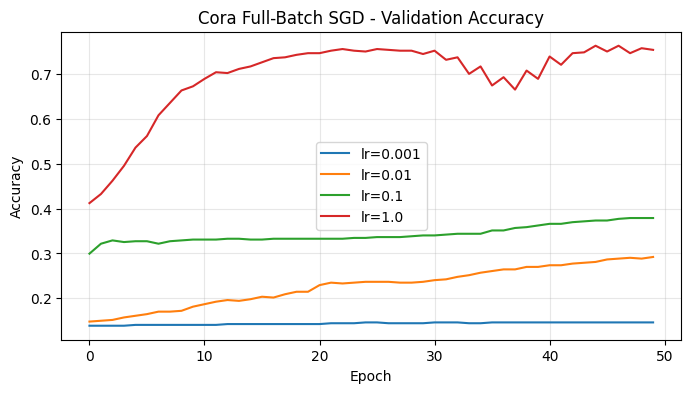

Final Cora validation accuracy (full-batch):
lr=0.001   -> val_accuracy=0.1460
lr=0.01    -> val_accuracy=0.2921
lr=0.1     -> val_accuracy=0.3789
lr=1.0     -> val_accuracy=0.7542
Final Cora test accuracy (full-batch):
lr=0.001   -> test_accuracy=0.1455
lr=0.01    -> test_accuracy=0.2284
lr=0.1     -> test_accuracy=0.3554
lr=1.0     -> test_accuracy=0.7661

Cora full-batch computation time:
lr=0.001   -> time=6.47 s
lr=0.01    -> time=5.57 s
lr=0.1     -> time=6.61 s
lr=1.0     -> time=5.55 s


In [29]:
# Training loss curves.
plt.figure(figsize=(8, 4))
for lr, hist in cora_full_batch_results.items():
    plt.plot(hist["loss"], label=f"lr={lr}")
plt.title("Cora Full-Batch SGD - Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

# Validation accuracy curves.
plt.figure(figsize=(8, 4))
for lr, hist in cora_full_batch_results.items():
    plt.plot(hist["val_accuracy"], label=f"lr={lr}")
plt.title("Cora Full-Batch SGD - Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

print("Final Cora validation accuracy (full-batch):")
for lr, hist in cora_full_batch_results.items():
    print(f"lr={lr:<7} -> val_accuracy={hist['val_accuracy'][-1]:.4f}")

print("Final Cora test accuracy (full-batch):")
for lr, hist in cora_full_batch_results.items():
    print(f"lr={lr:<7} -> test_accuracy={hist['test_accuracy'][-1]:.4f}")

print()
print("Cora full-batch computation time:")
for lr in cora_lrs:
    print(f"lr={lr:<7} -> time={cora_full_batch_times[lr]:.2f} s")


## 4.2 GCN and GAT


In [30]:
# Build Cora graph structure from cora.cites and prepare tensors/masks.
cites_candidates = list(extract_dir.rglob("cora.cites"))
if not cites_candidates:
    raise FileNotFoundError(f"Could not find cora.cites under {extract_dir}")

cites_path = cites_candidates[0]
print("Using Cora cites file:", cites_path)

paper_ids = content[:, 0]
paper_id_to_idx = {paper_id: idx for idx, paper_id in enumerate(paper_ids)}

cites = np.genfromtxt(cites_path, dtype=str)
if cites.ndim == 1:
    cites = np.expand_dims(cites, axis=0)

edge_rows = []
edge_cols = []
for src_id, dst_id in cites:
    src = paper_id_to_idx.get(src_id)
    dst = paper_id_to_idx.get(dst_id)
    if src is None or dst is None:
        continue

    # Undirected version of citation graph.
    edge_rows.extend([src, dst])
    edge_cols.extend([dst, src])

num_nodes = x_cora.shape[0]
adj = np.zeros((num_nodes, num_nodes), dtype="float32")
adj[edge_rows, edge_cols] = 1.0
adj[np.arange(num_nodes), np.arange(num_nodes)] = 1.0  # self-loops

# Symmetric normalization for GCN: D^{-1/2} A D^{-1/2}
degrees = np.sum(adj, axis=1)
deg_inv_sqrt = np.power(degrees, -0.5, where=degrees > 0)
deg_inv_sqrt[degrees == 0] = 0.0
adj_norm = deg_inv_sqrt[:, None] * adj * deg_inv_sqrt[None, :]

# Masks for train/validation/test nodes.
train_mask = np.zeros(num_nodes, dtype=bool)
val_mask = np.zeros(num_nodes, dtype=bool)
test_mask = np.zeros(num_nodes, dtype=bool)
train_mask[train_idx] = True
val_mask[val_idx] = True
test_mask[test_idx] = True

# TensorFlow tensors used by GCN/GAT models.
X_tf = tf.convert_to_tensor(x_cora, dtype=tf.float32)
y_tf = tf.convert_to_tensor(y_cora, dtype=tf.int32)
A_tf = tf.convert_to_tensor(adj, dtype=tf.float32)
A_norm_tf = tf.convert_to_tensor(adj_norm, dtype=tf.float32)

train_mask_tf = tf.convert_to_tensor(train_mask)
val_mask_tf = tf.convert_to_tensor(val_mask)
test_mask_tf = tf.convert_to_tensor(test_mask)

print("Num nodes:", num_nodes)
print("Num edges (undirected, self-loops excluded):", len(edge_rows) // 2)
print("Feature dim:", X_tf.shape[1])
print("Num classes:", len(cora_classes))


Using Cora cites file: /root/.keras/datasets/cora_extracted/cora/cora.cites
Num nodes: 2708
Num edges (undirected, self-loops excluded): 5429
Feature dim: 1433
Num classes: 7


In [31]:
# GCN model definition.
class GCNModel(tf.keras.Model):
    def __init__(self, hidden_dim, num_classes, dropout_rate=0.5):
        super().__init__()
        self.dense1 = tf.keras.layers.Dense(hidden_dim, use_bias=False)
        self.dropout = tf.keras.layers.Dropout(dropout_rate)
        self.dense2 = tf.keras.layers.Dense(num_classes, use_bias=False)

    def call(self, x, a_norm, training=False):
        h = tf.matmul(a_norm, x)
        h = self.dense1(h)
        h = tf.nn.relu(h)
        h = self.dropout(h, training=training)
        h = tf.matmul(a_norm, h)
        logits = self.dense2(h)
        return logits


In [32]:
# Train GCN on full Cora graph (supervision on train_mask nodes only).
tf.keras.backend.clear_session()
tf.keras.utils.set_random_seed(SEED)

gcn_model = GCNModel(hidden_dim=64, num_classes=len(cora_classes), dropout_rate=0.5)
gcn_optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

gcn_epochs = 50
gcn_history = {"train_loss": [], "train_acc": [], "val_acc": [], "test_acc": []}

try:
    from tqdm.auto import trange
    gcn_epoch_iter = trange(gcn_epochs, desc="GCN training")
    use_tqdm = True
except Exception:
    gcn_epoch_iter = range(gcn_epochs)
    use_tqdm = False

start_time = time.perf_counter()
for epoch in gcn_epoch_iter:
    with tf.GradientTape() as tape:
        logits = gcn_model(X_tf, A_norm_tf, training=True)
        train_loss = loss_fn(
            tf.boolean_mask(y_tf, train_mask_tf),
            tf.boolean_mask(logits, train_mask_tf),
        )

    grads = tape.gradient(train_loss, gcn_model.trainable_variables)
    gcn_optimizer.apply_gradients(zip(grads, gcn_model.trainable_variables))

    logits_eval = gcn_model(X_tf, A_norm_tf, training=False)
    preds = tf.argmax(logits_eval, axis=1, output_type=tf.int32)

    train_acc = tf.reduce_mean(
        tf.cast(
            tf.equal(tf.boolean_mask(preds, train_mask_tf), tf.boolean_mask(y_tf, train_mask_tf)),
            tf.float32,
        )
    )
    val_acc = tf.reduce_mean(
        tf.cast(
            tf.equal(tf.boolean_mask(preds, val_mask_tf), tf.boolean_mask(y_tf, val_mask_tf)),
            tf.float32,
        )
    )
    test_acc = tf.reduce_mean(
        tf.cast(
            tf.equal(tf.boolean_mask(preds, test_mask_tf), tf.boolean_mask(y_tf, test_mask_tf)),
            tf.float32,
        )
    )

    gcn_history["train_loss"].append(float(train_loss.numpy()))
    gcn_history["train_acc"].append(float(train_acc.numpy()))
    gcn_history["val_acc"].append(float(val_acc.numpy()))
    gcn_history["test_acc"].append(float(test_acc.numpy()))

    if use_tqdm:
        gcn_epoch_iter.set_postfix({"loss": f"{train_loss.numpy():.4f}", "val_acc": f"{val_acc.numpy():.4f}"})

gcn_time = time.perf_counter() - start_time

print(f"GCN final val accuracy:  {gcn_history['val_acc'][-1]:.4f}")
print(f"GCN final test accuracy: {gcn_history['test_acc'][-1]:.4f}")
print(f"GCN training time: {gcn_time:.2f} s")


GCN training:   0%|          | 0/50 [00:00<?, ?it/s]

GCN final val accuracy:  0.8799
GCN final test accuracy: 0.8711
GCN training time: 5.87 s


In [33]:
# GAT model definition (single attention head for simplicity).
class GATModel(tf.keras.Model):
    def __init__(self, hidden_dim, num_classes, dropout_rate=0.5, leaky_alpha=0.2):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.feature_proj = tf.keras.layers.Dense(hidden_dim, use_bias=False)
        self.output_proj = tf.keras.layers.Dense(num_classes, use_bias=False)
        self.dropout = tf.keras.layers.Dropout(dropout_rate)
        self.attn_dropout = tf.keras.layers.Dropout(dropout_rate)
        self.leaky_alpha = leaky_alpha

    def build(self, input_shape):
        self.a_src = self.add_weight(
            shape=(self.hidden_dim, 1), initializer="glorot_uniform", trainable=True, name="a_src"
        )
        self.a_dst = self.add_weight(
            shape=(self.hidden_dim, 1), initializer="glorot_uniform", trainable=True, name="a_dst"
        )
        super().build(input_shape)

    def call(self, x, a_mask, training=False):
        h = self.feature_proj(x)
        h = self.dropout(h, training=training)

        f1 = tf.matmul(h, self.a_src)  # [N, 1]
        f2 = tf.matmul(h, self.a_dst)  # [N, 1]
        e = tf.nn.leaky_relu(f1 + tf.transpose(f2), alpha=self.leaky_alpha)  # [N, N]

        minus_inf = tf.constant(-1e9, dtype=tf.float32)
        e_masked = tf.where(a_mask > 0.0, e, minus_inf)

        attention = tf.nn.softmax(e_masked, axis=1)
        attention = self.attn_dropout(attention, training=training)

        h_prime = tf.matmul(attention, h)
        h_prime = tf.nn.elu(h_prime)
        h_prime = self.dropout(h_prime, training=training)

        logits = self.output_proj(h_prime)
        return logits


In [34]:
# Train GAT on full Cora graph (supervision on train_mask nodes only).
tf.keras.backend.clear_session()
tf.keras.utils.set_random_seed(SEED)

gat_model = GATModel(hidden_dim=64, num_classes=len(cora_classes), dropout_rate=0.5, leaky_alpha=0.2)
gat_optimizer = tf.keras.optimizers.Adam(learning_rate=0.005)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

gat_epochs = 50
gat_history = {"train_loss": [], "train_acc": [], "val_acc": [], "test_acc": []}

try:
    from tqdm.auto import trange
    gat_epoch_iter = trange(gat_epochs, desc="GAT training")
    use_tqdm = True
except Exception:
    gat_epoch_iter = range(gat_epochs)
    use_tqdm = False

start_time = time.perf_counter()
for epoch in gat_epoch_iter:
    with tf.GradientTape() as tape:
        logits = gat_model(X_tf, A_tf, training=True)
        train_loss = loss_fn(
            tf.boolean_mask(y_tf, train_mask_tf),
            tf.boolean_mask(logits, train_mask_tf),
        )

    grads = tape.gradient(train_loss, gat_model.trainable_variables)
    gat_optimizer.apply_gradients(zip(grads, gat_model.trainable_variables))

    logits_eval = gat_model(X_tf, A_tf, training=False)
    preds = tf.argmax(logits_eval, axis=1, output_type=tf.int32)

    train_acc = tf.reduce_mean(
        tf.cast(
            tf.equal(tf.boolean_mask(preds, train_mask_tf), tf.boolean_mask(y_tf, train_mask_tf)),
            tf.float32,
        )
    )
    val_acc = tf.reduce_mean(
        tf.cast(
            tf.equal(tf.boolean_mask(preds, val_mask_tf), tf.boolean_mask(y_tf, val_mask_tf)),
            tf.float32,
        )
    )
    test_acc = tf.reduce_mean(
        tf.cast(
            tf.equal(tf.boolean_mask(preds, test_mask_tf), tf.boolean_mask(y_tf, test_mask_tf)),
            tf.float32,
        )
    )

    gat_history["train_loss"].append(float(train_loss.numpy()))
    gat_history["train_acc"].append(float(train_acc.numpy()))
    gat_history["val_acc"].append(float(val_acc.numpy()))
    gat_history["test_acc"].append(float(test_acc.numpy()))

    if use_tqdm:
        gat_epoch_iter.set_postfix({"loss": f"{train_loss.numpy():.4f}", "val_acc": f"{val_acc.numpy():.4f}"})

gat_time = time.perf_counter() - start_time

print(f"GAT final val accuracy:  {gat_history['val_acc'][-1]:.4f}")
print(f"GAT final test accuracy: {gat_history['test_acc'][-1]:.4f}")
print(f"GAT training time: {gat_time:.2f} s")


GAT training:   0%|          | 0/50 [00:00<?, ?it/s]

GAT final val accuracy:  0.8688
GAT final test accuracy: 0.8932
GAT training time: 4.09 s


Best MLP baseline: MLP full-batch lr=1.0
  val_acc=0.7542, test_acc=0.7661, time=5.55s
GCN: val_acc=0.8799, test_acc=0.8711, time=5.87s
GAT: val_acc=0.8688, test_acc=0.8932, time=4.09s


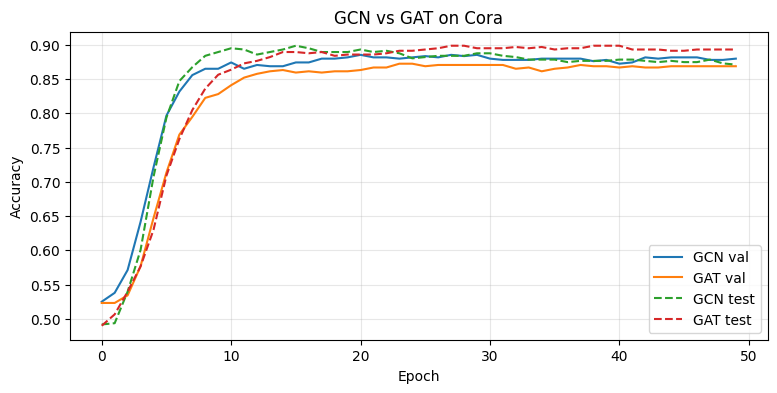

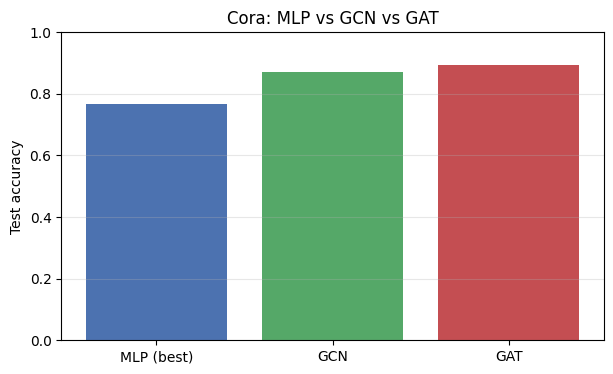

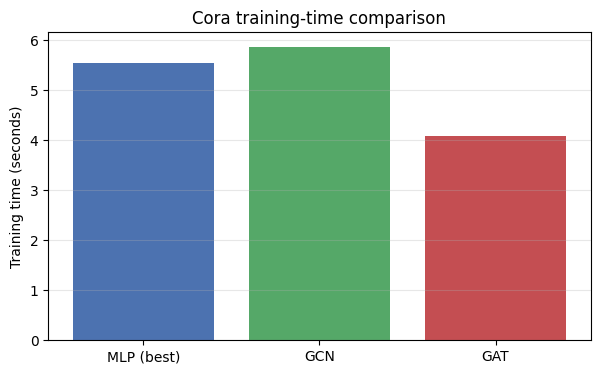

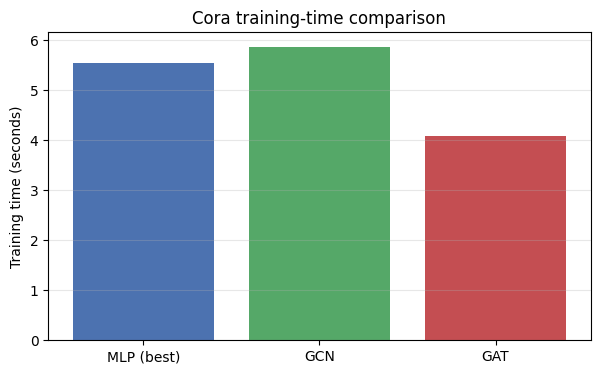

In [35]:
# Compare best MLP baseline (from previous Cora cells) vs GCN vs GAT.
mlp_candidates = []

if "cora_full_batch_results" in globals():
    for lr, hist in cora_full_batch_results.items():
        mlp_candidates.append(
            {
                "name": f"MLP full-batch lr={lr}",
                "val_acc": float(hist["val_accuracy"][-1]),
                "test_acc": float(hist["test_accuracy"][-1]),
                "time": float(cora_full_batch_times.get(lr, np.nan)),
            }
        )

if not mlp_candidates:
    raise RuntimeError("No MLP baseline found. Please run previous Cora MLP cells first.")

best_mlp = max(mlp_candidates, key=lambda d: d["test_acc"])

comparison_names = ["MLP (best)", "GCN", "GAT"]
comparison_val = [best_mlp["val_acc"], gcn_history["val_acc"][-1], gat_history["val_acc"][-1]]
comparison_test = [best_mlp["test_acc"], gcn_history["test_acc"][-1], gat_history["test_acc"][-1]]
comparison_time = [best_mlp["time"], gcn_time, gat_time]
comparison_params = [cora_mlp.count_params(), gcn_model.count_params(), gat_model.count_params()]

print("Best MLP baseline:", best_mlp["name"])
print(f"  val_acc={best_mlp['val_acc']:.4f}, test_acc={best_mlp['test_acc']:.4f}, time={best_mlp['time']:.2f}s")
print(f"GCN: val_acc={gcn_history['val_acc'][-1]:.4f}, test_acc={gcn_history['test_acc'][-1]:.4f}, time={gcn_time:.2f}s")
print(f"GAT: val_acc={gat_history['val_acc'][-1]:.4f}, test_acc={gat_history['test_acc'][-1]:.4f}, time={gat_time:.2f}s")

# Accuracy curves for GCN and GAT.
plt.figure(figsize=(9, 4))
plt.plot(gcn_history["val_acc"], label="GCN val")
plt.plot(gat_history["val_acc"], label="GAT val")
plt.plot(gcn_history["test_acc"], "--", label="GCN test")
plt.plot(gat_history["test_acc"], "--", label="GAT test")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("GCN vs GAT on Cora")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

# Final test-accuracy comparison.
plt.figure(figsize=(7, 4))
plt.bar(comparison_names, comparison_test, color=["#4C72B0", "#55A868", "#C44E52"])
plt.ylim(0.0, 1.0)
plt.ylabel("Test accuracy")
plt.title("Cora: MLP vs GCN vs GAT")
plt.grid(axis="y", alpha=0.3)
plt.show()

# Training-time comparison.
plt.figure(figsize=(7, 4))
plt.bar(comparison_names, comparison_time, color=["#4C72B0", "#55A868", "#C44E52"])
plt.ylabel("Training time (seconds)")
plt.title("Cora training-time comparison")
plt.grid(axis="y", alpha=0.3)
plt.show()

# Parameter comparison.
plt.figure(figsize=(7, 4))
plt.bar(comparison_names, comparison_time, color=["#4C72B0", "#55A868", "#C44E52"])
plt.ylabel("Training time (seconds)")
plt.title("Cora training-time comparison")
plt.grid(axis="y", alpha=0.3)
plt.show()


### PCA comparison of node representations
We compare 2D PCA projections using:
- original Cora node features
- MLP hidden embeddings
- GCN hidden embeddings
- GAT hidden embeddings


Best MLP config for embedding extraction:
{'mode': 'full', 'lr': 1.0, 'val_acc': 0.7541589736938477, 'test_acc': 0.7661141753196716}


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

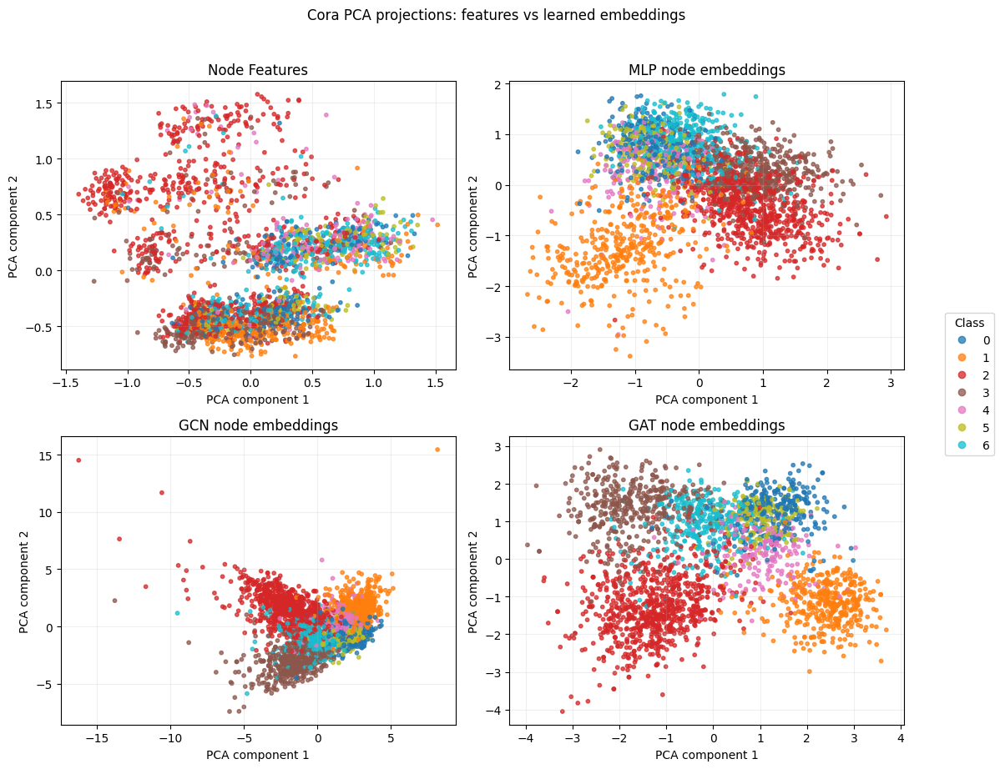

In [36]:
# Build embeddings for MLP, GCN, and GAT, then compare PCA projections.

# Recover best MLP configuration from previous baseline results.
mlp_candidates = []
if "cora_full_batch_results" in globals():
    for lr, hist in cora_full_batch_results.items():
        mlp_candidates.append(
            {
                "mode": "full",
                "lr": float(lr),
                "val_acc": float(hist["val_accuracy"][-1]),
                "test_acc": float(hist["test_accuracy"][-1]),
            }
        )
if "cora_minibatch_results" in globals():
    for lr, hist in cora_minibatch_results.items():
        mlp_candidates.append(
            {
                "mode": "mini",
                "lr": float(lr),
                "val_acc": float(hist["val_accuracy"][-1]),
                "test_acc": float(hist["test_accuracy"][-1]),
            }
        )

if not mlp_candidates:
    raise RuntimeError("Run Cora MLP baseline cells first.")

best_mlp_cfg = max(mlp_candidates, key=lambda d: d["test_acc"])
mlp_batch_size = len(x_train_cora) if best_mlp_cfg["mode"] == "full" else 64

print("Best MLP config for embedding extraction:")
print(best_mlp_cfg)

# Train one MLP model with the best config, then extract hidden representations.
# Use Functional API (instead of Sequential.input) for robust extractor creation in Keras 3.
tf.keras.backend.clear_session()
tf.keras.utils.set_random_seed(SEED)

mlp_input = tf.keras.Input(shape=(x_train_cora.shape[1],), name="mlp_input")
mlp_hidden = tf.keras.layers.Dense(64, activation="relu", name="mlp_hidden")(mlp_input)
mlp_logits = tf.keras.layers.Dense(len(cora_classes), name="mlp_logits")(mlp_hidden)
mlp_embed_model = tf.keras.Model(inputs=mlp_input, outputs=mlp_logits, name="mlp_for_embeddings")

mlp_embed_model.compile(
    optimizer=tf.keras.optimizers.SGD(learning_rate=best_mlp_cfg["lr"]),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=["accuracy"],
)

_ = mlp_embed_model.fit(
    x_train_cora,
    y_train_cora,
    validation_data=(x_val_cora, y_val_cora),
    epochs=50,
    batch_size=mlp_batch_size,
    shuffle=True,
    callbacks=make_tqdm_callbacks(),
    verbose=0,
)

mlp_hidden_extractor = tf.keras.Model(
    inputs=mlp_embed_model.inputs,
    outputs=mlp_embed_model.get_layer("mlp_hidden").output,
)
mlp_embeddings = mlp_hidden_extractor.predict(x_cora, batch_size=256, verbose=0)

# GCN embeddings: hidden layer after first graph propagation + linear + ReLU.
gcn_hidden = tf.matmul(A_norm_tf, X_tf)
gcn_hidden = gcn_model.dense1(gcn_hidden)
gcn_hidden = tf.nn.relu(gcn_hidden)
gcn_embeddings = gcn_hidden.numpy()

# GAT embeddings: hidden representation before final output projection.
gat_h = gat_model.feature_proj(X_tf)
f1 = tf.matmul(gat_h, gat_model.a_src)
f2 = tf.matmul(gat_h, gat_model.a_dst)
gat_scores = tf.nn.leaky_relu(f1 + tf.transpose(f2), alpha=gat_model.leaky_alpha)
minus_inf = tf.constant(-1e9, dtype=tf.float32)
gat_scores = tf.where(A_tf > 0.0, gat_scores, minus_inf)
gat_attn = tf.nn.softmax(gat_scores, axis=1)
gat_embeddings = tf.nn.elu(tf.matmul(gat_attn, gat_h)).numpy()

# Raw features baseline.
raw_features = x_cora


def pca_2d(x):
    x = x.astype("float32")
    x_centered = x - x.mean(axis=0, keepdims=True)
    _, _, vt = np.linalg.svd(x_centered, full_matrices=False)
    return x_centered @ vt[:2].T


proj_raw = pca_2d(raw_features)
proj_mlp = pca_2d(mlp_embeddings)
proj_gcn = pca_2d(gcn_embeddings)
proj_gat = pca_2d(gat_embeddings)

fig, axes = plt.subplots(2, 2, figsize=(12, 9))
plots = [
    (proj_raw, "Node Features"),
    (proj_mlp, "MLP node embeddings"),
    (proj_gcn, "GCN node embeddings"),
    (proj_gat, "GAT node embeddings"),
]

for ax, (proj, title) in zip(axes.ravel(), plots):
    sc = ax.scatter(
        proj[:, 0],
        proj[:, 1],
        c=y_cora,
        cmap="tab10",
        s=10,
        alpha=0.75,
    )
    ax.set_title(title)
    ax.set_xlabel("PCA component 1")
    ax.set_ylabel("PCA component 2")
    ax.grid(alpha=0.2)

handles, _ = sc.legend_elements()
fig.legend(
    handles,
    [str(i) for i in range(len(cora_classes))],
    title="Class",
    loc="center right",
)
fig.suptitle("Cora PCA projections: features vs learned embeddings", y=1.02)
plt.tight_layout(rect=[0, 0, 0.92, 1])
plt.show()
